In [1]:
import sys
sys.path.append('..')

import pathlib
import numpy as np
from skimage.color import rgb2gray
from skimage.transform import resize, rescale
from skimage.exposure import adjust_gamma, equalize_hist
from skimage.filters import gaussian, laplace

from utils import transform_and_store, plot_transformation_comparison


In [2]:
main_path='../dados/Hypercellularity/'

# Roteiro I

## Aplicando resize nas imagens

In [3]:
def apply_resizing(input_image):
    return resize(image=input_image, output_shape=(700,700)) 

transform_and_store(
    main_path=main_path,
    data_folder_name='00-original', 
    new_folder_name='01-resized', 
    transformation_function=apply_resizing
    )

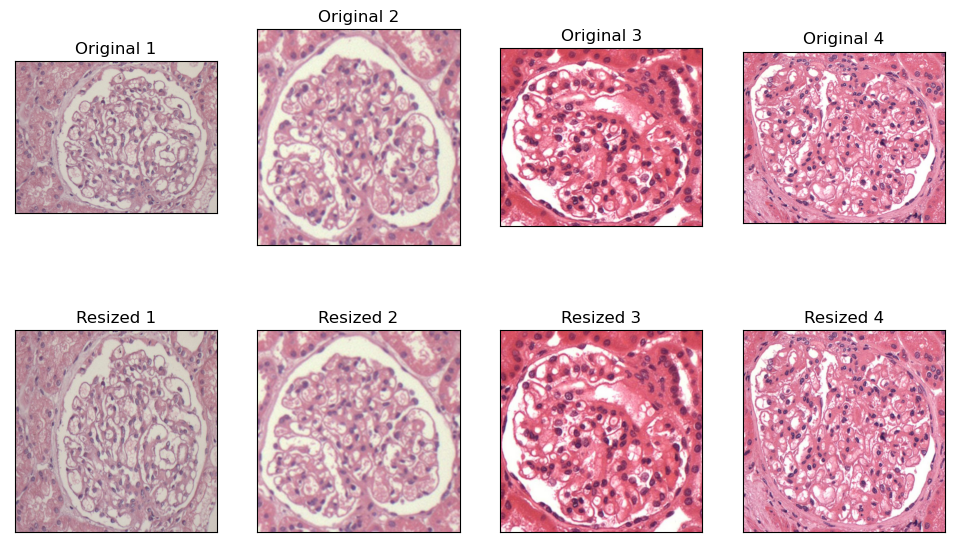

In [4]:
plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='00-original', 
    new_folder_name='01-resized',
    )

## Transformando imagens em gray scale 

In [5]:
def apply_gray_transformation(input_image):
    return rgb2gray(input_image)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='02-grayScaled', 
    transformation_function=apply_gray_transformation
    )

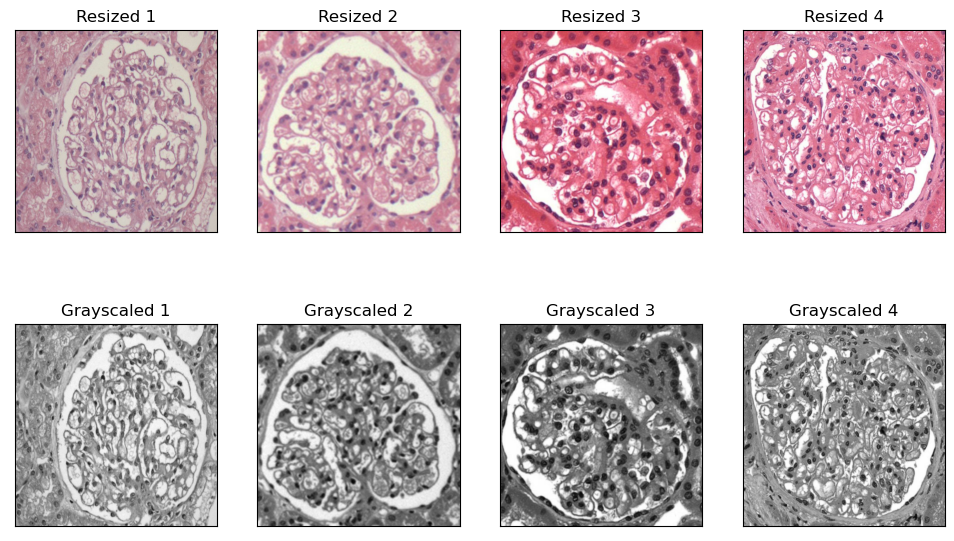

In [6]:
plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='02-grayScaled', 
    )

## Aplicando equalização de histograma em gray scale

In [7]:
def apply_hist_transformation(input_image):
    return equalize_hist(input_image)

transform_and_store(
    main_path=main_path,
    data_folder_name='02-grayScaled', 
    new_folder_name='03-equalizesHist', 
    transformation_function=apply_hist_transformation
    )

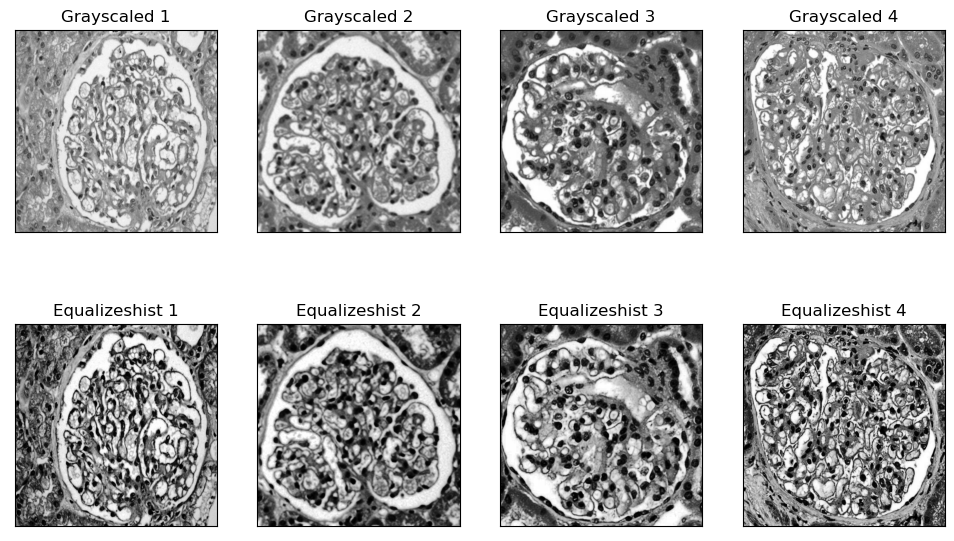

In [8]:
plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='02-grayScaled', 
    new_folder_name='03-equalizesHist', 
    )

## Aplicando correção gamma

### Gamma I (valor=1)

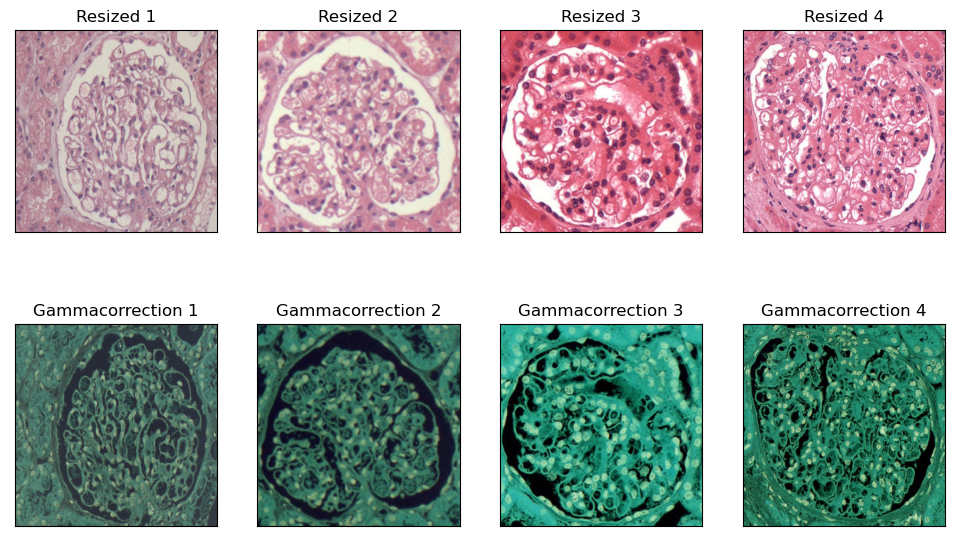

In [9]:
def apply_gamma_transformation(input_image):
    return adjust_gamma(input_image, gamma=1)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='04-gammaCorrection', 
    transformation_function=apply_gamma_transformation
    )

plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='04-gammaCorrection', 
    )

### Gamma II (valor=2)

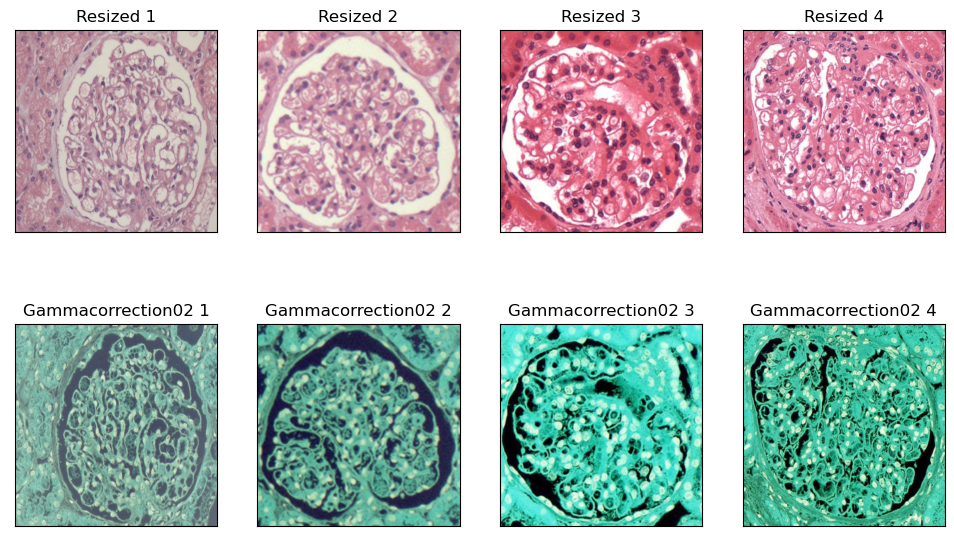

In [10]:
def apply_gamma_transformation(input_image):
    return adjust_gamma(input_image, gamma=2)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='05-gammaCorrection02', 
    transformation_function=apply_gamma_transformation
    )

plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='05-gammaCorrection02', 
    )

### Gamma III (valor=3)

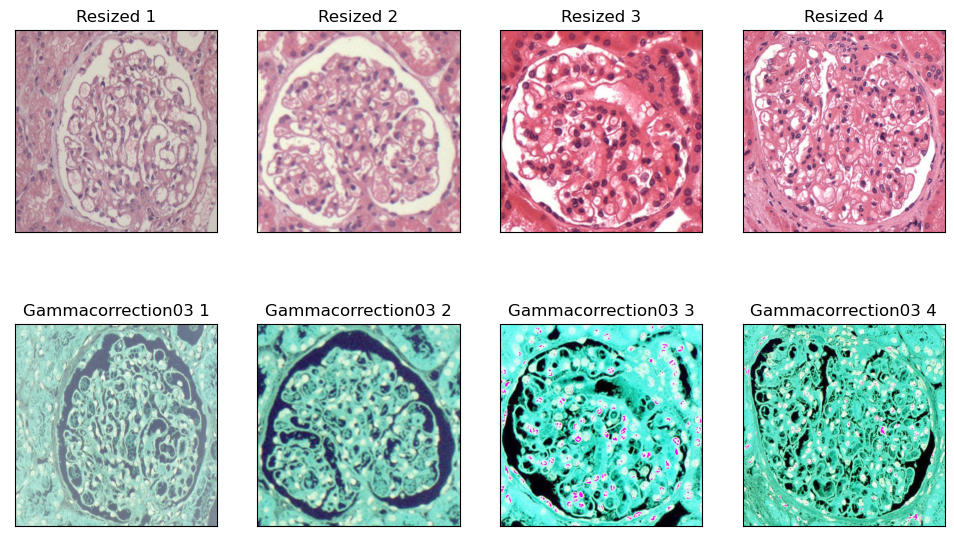

In [11]:
def apply_gamma_transformation(input_image):
    return adjust_gamma(input_image, gamma=3)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='06-gammaCorrection03', 
    transformation_function=apply_gamma_transformation
    )

plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='06-gammaCorrection03', 
    )

## Aplicando filtro gaussiano

/tmp/ipykernel_10765/214684364.py:2: FutureWarning: `multichannel` is a deprecated argument name for `gaussian`. It will be removed in version 1.0. Please use `channel_axis` instead.
  return gaussian(input_image, sigma=3, multichannel=True)


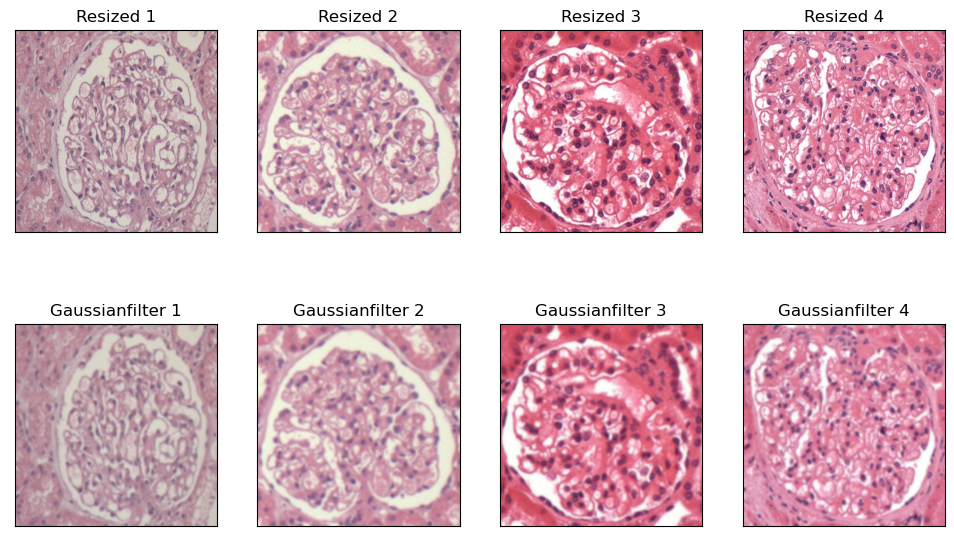

In [12]:

def apply_gaussian_transformation(input_image):
    return gaussian(input_image, sigma=3, multichannel=True)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='07-gaussianFilter', 
    transformation_function=apply_gaussian_transformation
    )

plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='07-gaussianFilter', 
    )

## Aplicando filtro laplace em RGB

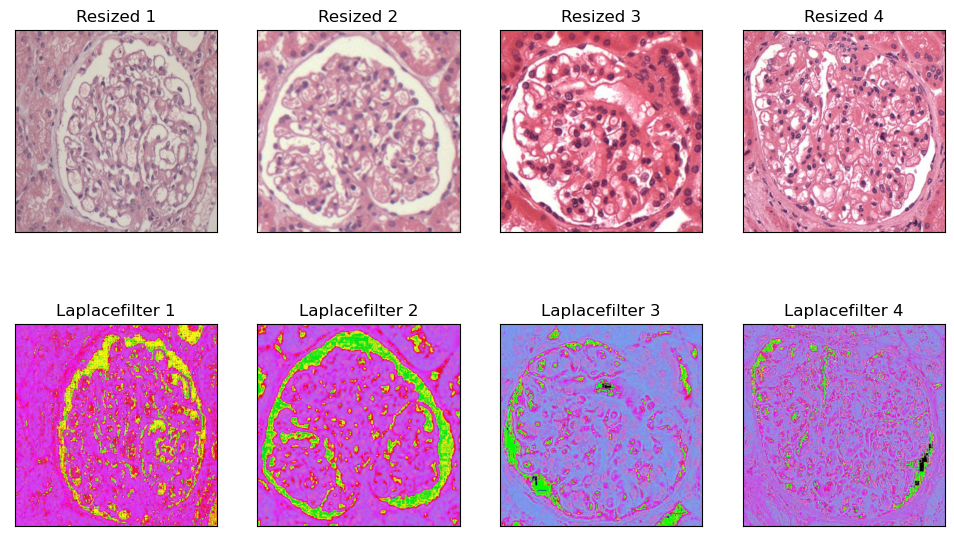

In [13]:

def apply_laplace_transformation(input_image):
    return laplace(input_image.astype(float) , ksize=4)

transform_and_store(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='08-laplaceFilter', 
    transformation_function=apply_laplace_transformation
    )

plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='01-resized', 
    new_folder_name='08-laplaceFilter', 
    )

## Aplicando filtro Laplaciano em imagens Gray Scaled 

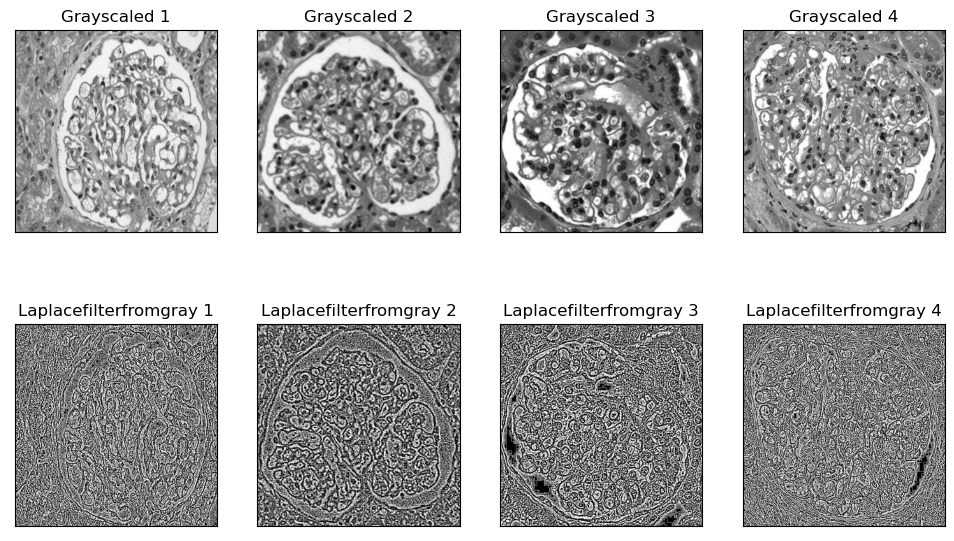

In [3]:
def apply_laplace_transformation(input_image):
    return laplace(input_image.astype(float))

transform_and_store(
    main_path=main_path,
    data_folder_name='02-grayScaled', 
    new_folder_name='09-laplaceFilterFromGray', 
    transformation_function=apply_laplace_transformation
    )

plot_transformation_comparison(
    main_path=main_path,
    data_folder_name='02-grayScaled', 
    new_folder_name='09-laplaceFilterFromGray', 
    )

# Roteiro II

In [59]:
def color_transformation(img, sum_constant, mult_constant):
    img64 = img.astype(np.float64)

    aux_img1 = img64.copy() * mult_constant
    aux_img1 *= (255.0/aux_img1.max())
    aux_img1 = aux_img1.astype(np.uint8)

    aux_img2 = img64.copy() + sum_constant
    aux_img2 *= (255.0/aux_img2.max())
    aux_img2 = aux_img2.astype(np.uint8)

    aux_img3 = (img64.copy() * mult_constant ) + sum_constant
    aux_img3 *= (255.0/aux_img3.max())
    aux_img3 = aux_img3.astype(np.uint8)

    return aux_img1, aux_img2, aux_img3


def plot_features(main_path, folders, titles):
    n_row, n_col = 3, 7
    f, axis = plt.subplots(n_row, n_col, figsize=(18, 7))

    for i, folder in enumerate(folders):
        path = list(pathlib.Path(main_path + folder + '/n/').glob('*'))

        if folder == '01-resized':
            img1 = imread(str(path[20]))
            img2 = imread(str(path[30]))
            img3 = imread(str(path[2]))
        else:
            img1 = np.load(str(path[20]))
            img2 = np.load(str(path[30]))
            img3 = np.load(str(path[2]))


        axis[0,i].imshow(img1,  cmap='gray')
        axis[0,i].set_title(titles[i])
        axis[0,i].set_xticks([])
        axis[0,i].set_yticks([])

        axis[1,i].imshow(img2,  cmap='gray')
        axis[1,i].set_title(titles[i])
        axis[1,i].set_xticks([])
        axis[1,i].set_yticks([])

        axis[2,i].imshow(img3, cmap='gray')
        axis[2,i].set_title(titles[i])
        axis[2,i].set_xticks([])
        axis[2,i].set_yticks([])

    plt.show()    

In [60]:
from skimage import io
from matplotlib import pyplot as plt

path = '../dados/Hypercellularity/01-resized/n/113IP71229AAE.jpg'
img = io.imread(path)

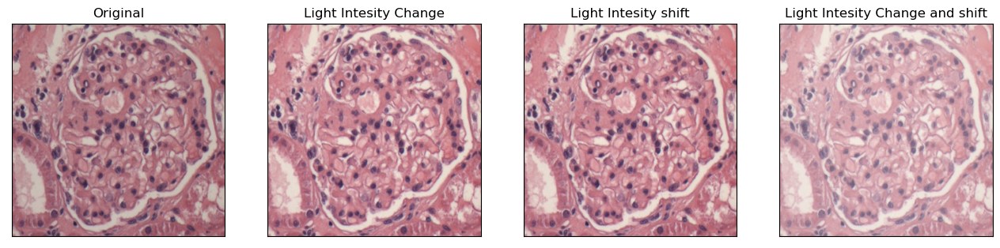

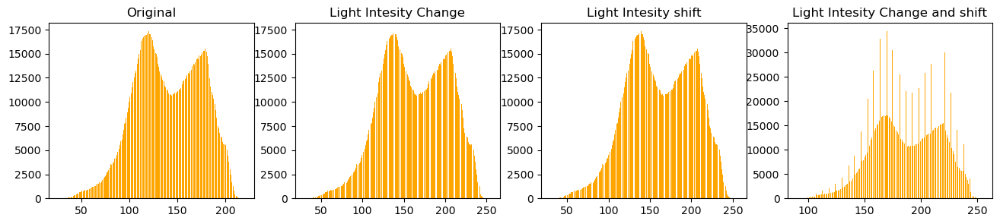

In [61]:


sum_constant = 200
mult_constant = 2.5

intesity_change, intesity_shift, intesity_change_shift = color_transformation(img, sum_constant, mult_constant)



plt.figure(figsize=(16,6))
plt.subplot(141), plt.imshow(img, cmap='gray'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(142), plt.imshow(intesity_change, cmap='gray'),plt.title('Light Intesity Change')
plt.xticks([]), plt.yticks([])
plt.subplot(143), plt.imshow(intesity_change, cmap='gray'),plt.title('Light Intesity shift')
plt.xticks([]), plt.yticks([])
plt.subplot(144), plt.imshow(intesity_change_shift, cmap='gray'),plt.title('Light Intesity Change and shift')
plt.xticks([]), plt.yticks([])
plt.show()

plt.figure(figsize=(16,3))
plt.subplot(141), plt.hist(img.ravel(), bins = 256, color = 'orange', ),plt.title('Original')
plt.subplot(142), plt.hist(intesity_change.ravel(), bins = 256, color = 'orange', ),plt.title('Light Intesity Change')
plt.subplot(143), plt.hist(intesity_change.ravel(), bins = 256, color = 'orange', ),plt.title('Light Intesity shift')
plt.subplot(144), plt.hist(intesity_change_shift.ravel(), bins = 256, color = 'orange', ),plt.title('Light Intesity Change and shift')
plt.show()

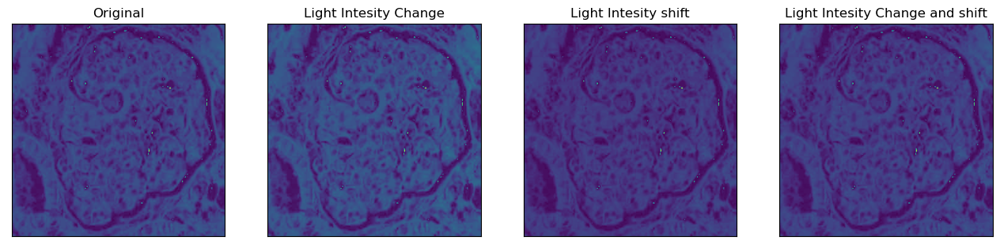

In [46]:
def calculate_oponents(img, type):
    def normalize(o):
        o *= (255.0/o.max())
        o = o.astype(np.uint8)
        return o
    if type=='o1':
        o = (img[:,:,0] - img[:,:,1]) / np.sqrt(2)
    else:
        o = (img[:,:,0] + img[:,:,1] - (2 * img[:,:,2])) / np.sqrt(6)
    return normalize(o)


o_img = calculate_oponents(img, type='o1')
o_intesity_change = calculate_oponents(intesity_change, type='o1')
o_intesity_shift = calculate_oponents(intesity_shift, type='o1')
o_intesity_change_shift = calculate_oponents(intesity_change_shift, type='o1')

plt.figure(figsize=(16,6))
plt.subplot(141), plt.imshow(o_img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(142), plt.imshow(o_intesity_change),plt.title('Light Intesity Change')
plt.xticks([]), plt.yticks([])
plt.subplot(143), plt.imshow(o_intesity_shift),plt.title('Light Intesity shift')
plt.xticks([]), plt.yticks([])
plt.subplot(144), plt.imshow(o_intesity_change_shift),plt.title('Light Intesity Change and shift')
plt.xticks([]), plt.yticks([])
plt.show()
plt.show()

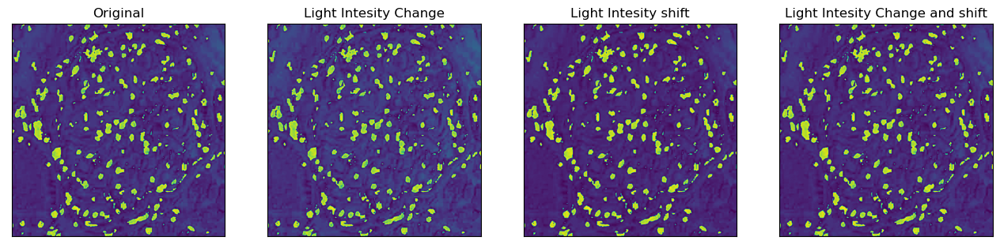

In [47]:
o_img = calculate_oponents(img, type='o2')
o_intesity_change = calculate_oponents(intesity_change, type='o2')
o_intesity_shift = calculate_oponents(intesity_shift, type='o2')
o_intesity_change_shift = calculate_oponents(intesity_change_shift, type='o2')

plt.figure(figsize=(16,6))
plt.subplot(141), plt.imshow(o_img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(142), plt.imshow(o_intesity_change),plt.title('Light Intesity Change')
plt.xticks([]), plt.yticks([])
plt.subplot(143), plt.imshow(o_intesity_shift),plt.title('Light Intesity shift')
plt.xticks([]), plt.yticks([])
plt.subplot(144), plt.imshow(o_intesity_change_shift),plt.title('Light Intesity Change and shift')
plt.xticks([]), plt.yticks([])
plt.show()
plt.show()

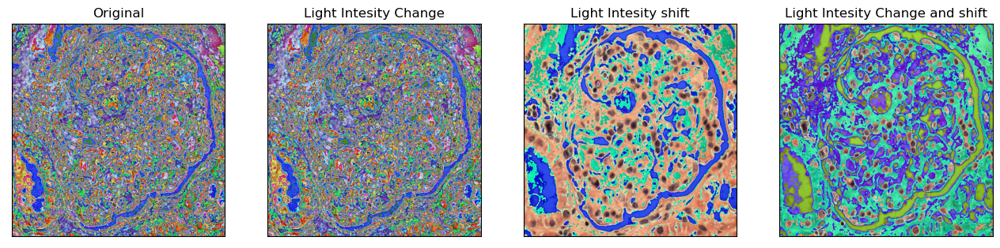

In [49]:
def calculate_transformed_color(img):
    def normalize(o):
        o *= (255.0/o.max())
        o = o.astype(np.uint8)
        return o
    r = normalize((img[:,:,0] - (img[:,:,0] * np.mean(img[:,:,0]))) / np.std(img[:,:,0]))
    g = normalize((img[:,:,1] - (img[:,:,1] * np.mean(img[:,:,1]))) / np.std(img[:,:,1]))
    b = normalize((img[:,:,2] - (img[:,:,2] * np.mean(img[:,:,2]))) / np.std(img[:,:,2]))
    return np.stack((r,g,b),axis=2)
  


o_img = calculate_transformed_color(img)
o_intesity_change = calculate_transformed_color(intesity_change)
o_intesity_shift = calculate_transformed_color(intesity_shift)
o_intesity_change_shift = calculate_transformed_color(intesity_change_shift)

plt.figure(figsize=(16,6))
plt.subplot(141), plt.imshow(o_img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(142), plt.imshow(o_intesity_change),plt.title('Light Intesity Change')
plt.xticks([]), plt.yticks([])
plt.subplot(143), plt.imshow(o_intesity_shift),plt.title('Light Intesity shift')
plt.xticks([]), plt.yticks([])
plt.subplot(144), plt.imshow(o_intesity_change_shift),plt.title('Light Intesity Change and shift')
plt.xticks([]), plt.yticks([])
plt.show()
plt.show()

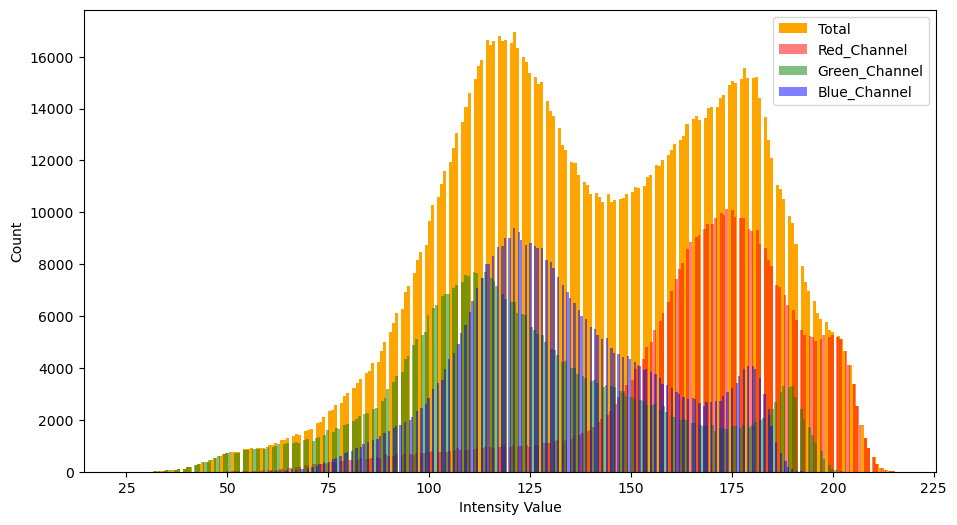

In [ ]:
from skimage import io

img = io.imread(path)
plt.figure(figsize=(11,6))
_ = plt.hist(img.ravel(), bins = 256, color = 'orange', )
_ = plt.hist(img[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
_ = plt.hist(img[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
_ = plt.hist(img[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
_ = plt.xlabel('Intensity Value')
_ = plt.ylabel('Count')
_ = plt.legend(['Total', 'Red_Channel', 'Green_Channel', 'Blue_Channel'])
plt.show()